### ライブラリのインストール

In [1]:
from ultralytics import YOLO
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path

## セグメンテーション　-version1.0(プロトタイプ)-

### モデルの読み込み

In [2]:
model = YOLO("../models/yolov8n-seg.pt")

### 画像の読み込み

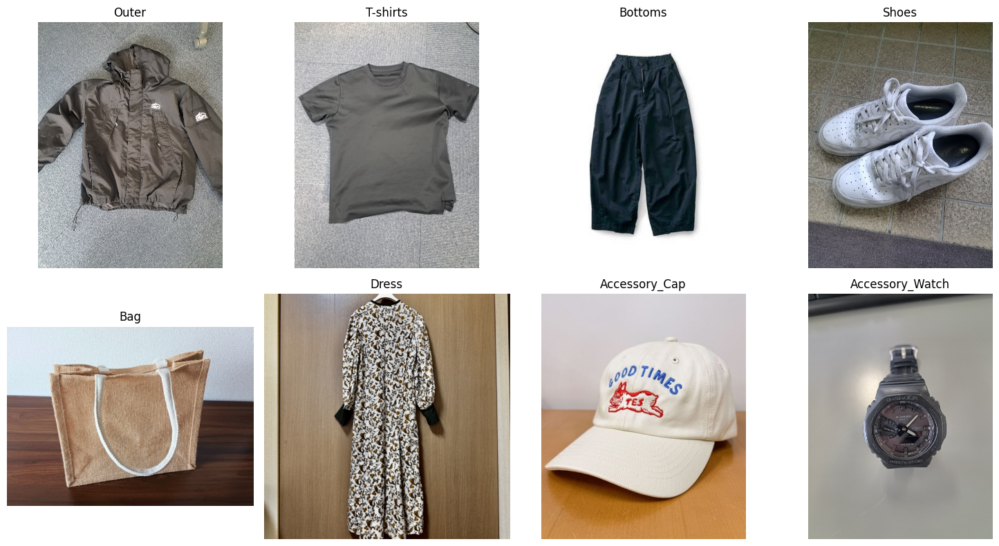

In [3]:
# 1. 画像パスのリスト（8枚分）
image_paths = [
    "input/sample_outer.jpg",             # 1: アウター
    "input/sample_Tshirts.jpg",           # 2: トップス
    "input/sample_bottoms.jpg",           # 3: ボトムス
    "input/sample_shoes.jpg",             # 4: シューズ
    "input/sample_bag.jpg",               # 5: バッグ
    "input/sample_dress.jpg",             # 6: ドレス
    "input/sample_accessory_cap.jpg",     # 7: アクセサリー(帽子)
    "input/sample_accessory_watch.jpg"    # 8: アクセサリー(時計)
]

# 画像のタイトル（表示用）
titles = ["Outer", "T-shirts", "Bottoms", "Shoes", "Bag", "Dress","Accessory_Cap", "Accessory_Watch" ]

# 2. 画面全体のサイズを設定
plt.figure(figsize=(15, 8))

# 3. ループ処理で8枚の画像を順番に読み込んで配置
for i in range(8):
    # 画像の読み込み
    img = cv2.imread(image_paths[i])
    # BGRからRGBに変換
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 2行 × 4列 の配置エリアを指定 (i + 1 番目の位置)
    plt.subplot(2, 4, i + 1)
    plt.imshow(img_rgb)
    plt.title(titles[i])
    plt.axis("off")  # 枠線と目盛りを非表示

# 隙間を自動調整して綺麗に並べる
plt.tight_layout()

# 画面に表示
plt.show()

### セグメンテーションの実行

In [4]:
# 予測結果を保存するための空のリストを用意
all_results = []

# image_paths には、先ほどの8枚の画像パスが入っている前提です
for i, path in enumerate(image_paths):
    # 1. 画像の読み込みとRGB変換
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 2. 予測の実行（タイトルに合わせてログを出すと分かりやすいです）
    print(f"--- Predicting: {titles[i]} ({path}) ---")
    results = model.predict(
        source=img_rgb,
        conf=0.4,
        save=False
    )
    
    # 3. 配列（リスト）に結果を格納していく
    all_results.append(results)

--- Predicting: Outer (input/sample_outer.jpg) ---

0: 640x480 (no detections), 825.2ms
Speed: 73.3ms preprocess, 825.2ms inference, 43.1ms postprocess per image at shape (1, 3, 640, 480)
--- Predicting: T-shirts (input/sample_Tshirts.jpg) ---

0: 640x480 1 person, 46.9ms
Speed: 2.2ms preprocess, 46.9ms inference, 83.1ms postprocess per image at shape (1, 3, 640, 480)
--- Predicting: Bottoms (input/sample_bottoms.jpg) ---

0: 640x544 1 vase, 63.3ms
Speed: 5.2ms preprocess, 63.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 544)
--- Predicting: Shoes (input/sample_shoes.jpg) ---

0: 640x480 (no detections), 33.7ms
Speed: 3.1ms preprocess, 33.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 480)
--- Predicting: Bag (input/sample_bag.jpg) ---

0: 480x640 1 suitcase, 45.8ms
Speed: 0.9ms preprocess, 45.8ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)
--- Predicting: Dress (input/sample_dress.jpg) ---

0: 640x640 1 tie, 54.2ms
Speed: 1.4ms p

### マスク取得

In [5]:
# 8枚分の「純粋な結果オブジェクト」を格納する辞書
processed_results = {}

for i, results in enumerate(all_results):
    # 各画像の最初の要素 [0] を取り出す（これが純粋なマスクやボックスの中身）
    result_object = results[0]
    
    # 画像のタイトル（"T-shirts" や "Shoes" など）をキーにして辞書に保存
    category_name = titles[i]
    processed_results[category_name] = result_object

print("\nすべての結果オブジェクトの読み込みが完了しました！")


すべての結果オブジェクトの読み込みが完了しました！


### マスクを出力

すべての画像のアノテーション処理（描画）が完了しました！


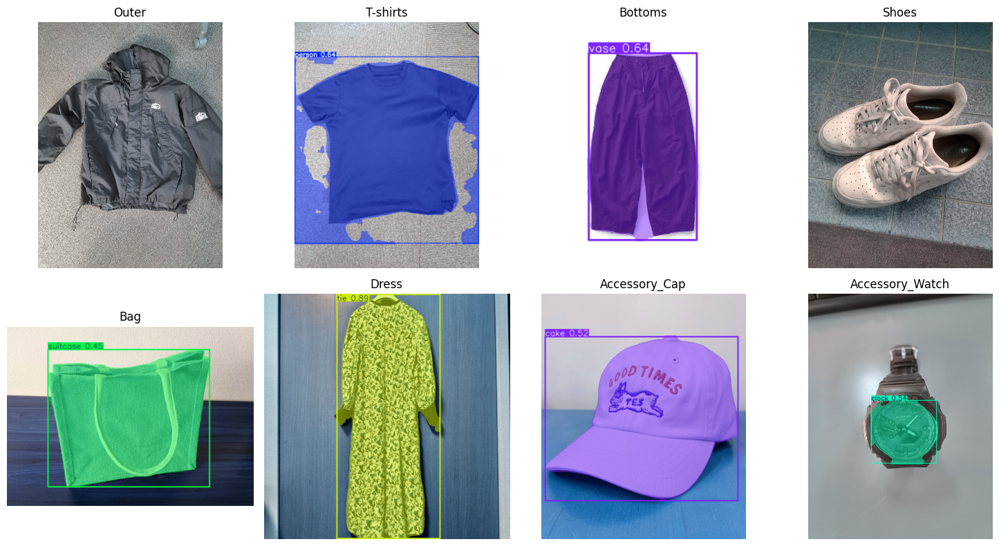

In [6]:
# アノテーション付き画像を格納する新しい辞書
annotated_images = {}

# 前のステップで作った processed_results 辞書をループ
# nameはタイトル（"T-shirts"など）、resultは結果オブジェクト
for name, result in processed_results.items():
    # 予測結果を描画した画像を生成（plotメソッド）
    # plot()はデフォルトでBGRなので、表示用にRGBに変換しておく
    img_bgr = result.plot()
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    # 辞書に保存
    annotated_images[name] = img_rgb

print("すべての画像のアノテーション処理（描画）が完了しました！")

# 画面全体のサイズを設定 (横に4枚並ぶので、横幅を広めの15インチに設定)
plt.figure(figsize=(15, 8))

# タイトルのリストを使って、順番に表示
for i, name in enumerate(titles):
    # アノテーション付き画像を取り出す
    img = annotated_images[name]
    
    # 2行 × 4列 の配置エリアを指定 (i + 1 番目の位置)
    plt.subplot(2, 4, i + 1)
    plt.imshow(img)
    plt.title(name)  # 画像のタイトルを表示
    plt.axis("off")  # 枠線と目盛りを非表示

# 隙間を自動調整して綺麗に並べる
plt.tight_layout()

# 画面に表示
plt.show()

- 本タスクの目的は画像をセグメンテーションすることであり、ラベルの如何は問わない。
- しかし、ラベル以前の前に主要な衣服のなかで識別すらされないものがが散見される

### マスクを白黒でnumpy形式に変換

In [9]:
# 1. Tシャツ（リストの2番目、インデックス1）の結果オブジェクトを取得
result_Tshirts = processed_results["T-shirts"]

# 2. マスクが検出されたかチェック
if result_Tshirts.masks is None:
    raise Exception("Tシャツのマスクが検出されませんでした")

# 3. マスクデータをCPUに移動させてNumPy配列に変換
masks_Tshirts = result_Tshirts.masks.data.cpu().numpy()

# 4. 1番目（最大）のマスクを抽出
largest_mask_Tshirts = masks_Tshirts[0]

print("Tシャツのマスク抽出に成功しました！")
print("マスクの形状（Shape）:", largest_mask_Tshirts.shape)

Tシャツのマスク抽出に成功しました！
マスクの形状（Shape）: (640, 480)


## 背景透過

In [11]:
mask_Tshirts = (largest_mask_Tshirts * 255).astype(np.uint8)#01の画像を0~255の画像へ変換

image_Tshirts = cv2.imread(image_paths[1])
image_Tshirts_rgb = cv2.cvtColor(image_Tshirts, cv2.COLOR_BGR2RGB)

mask_Tshirts = cv2.resize(
    mask_Tshirts,
    (image_Tshirts_rgb.shape[1], image_Tshirts_rgb.shape[0])
)#マスク画像を元画像のサイズにリサイズ

rgba = cv2.cvtColor(image_Tshirts_rgb, cv2.COLOR_RGB2RGBA)

rgba[:, :, 3] = mask_Tshirts

output_path = "output/transparent.png"

Image.fromarray(rgba).save(output_path)

print("保存完了:", output_path)

保存完了: output/transparent.png


(np.float64(-0.5), np.float64(3467.5), np.float64(4623.5), np.float64(-0.5))

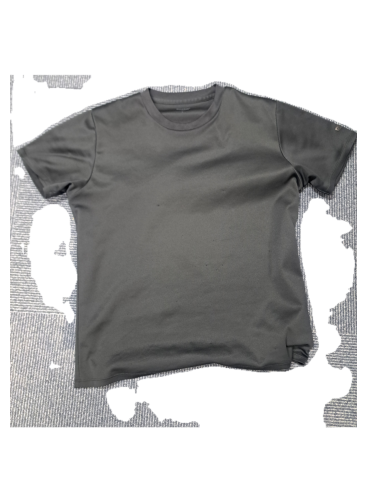

In [12]:
#結果確認
transparent = Image.open(output_path)

plt.figure(figsize=(6,6))
plt.imshow(transparent)
plt.axis("off")

## セグメンテーション -version2.0(Fashionpedia_7classでファインチューニング:epoch数15)-

In [7]:
model = YOLO("../models/fashionpedia_best.pt")

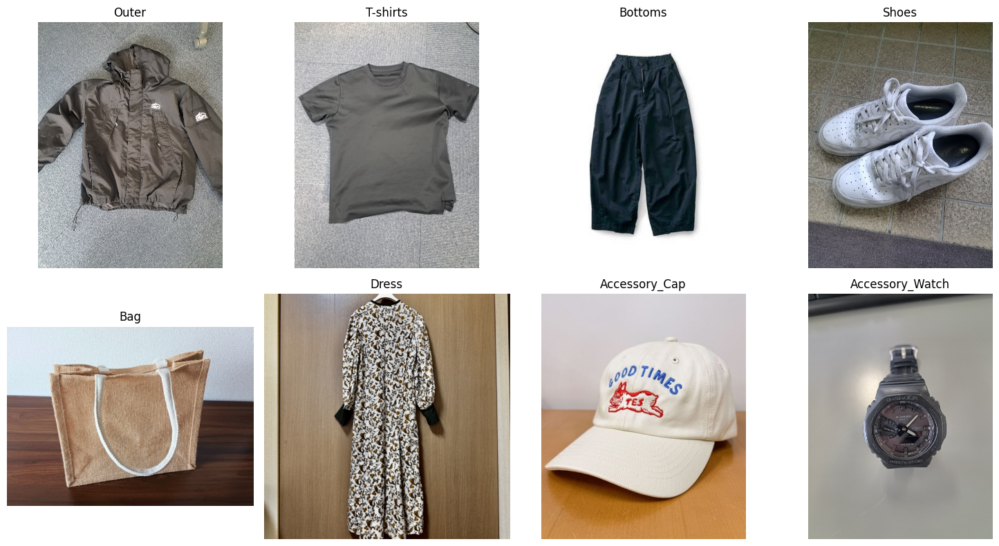

In [8]:
# 1. 画像パスのリスト（8枚分）
image_paths = [
    "input/sample_outer.jpg",             # 1: アウター
    "input/sample_Tshirts.jpg",           # 2: トップス
    "input/sample_bottoms.jpg",           # 3: ボトムス
    "input/sample_shoes.jpg",             # 4: シューズ
    "input/sample_bag.jpg",               # 5: バッグ
    "input/sample_dress.jpg",             # 6: ドレス
    "input/sample_accessory_cap.jpg",     # 7: アクセサリー(帽子)
    "input/sample_accessory_watch.jpg"    # 8: アクセサリー(時計)
]

# 画像のタイトル（表示用）
titles = ["Outer", "T-shirts", "Bottoms", "Shoes", "Bag", "Dress","Accessory_Cap", "Accessory_Watch" ]

# 2. 画面全体のサイズを設定
plt.figure(figsize=(15, 8))

# 3. ループ処理で8枚の画像を順番に読み込んで配置
for i in range(8):
    # 画像の読み込み
    img = cv2.imread(image_paths[i])
    # BGRからRGBに変換
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 2行 × 4列 の配置エリアを指定 (i + 1 番目の位置)
    plt.subplot(2, 4, i + 1)
    plt.imshow(img_rgb)
    plt.title(titles[i])
    plt.axis("off")  # 枠線と目盛りを非表示

# 隙間を自動調整して綺麗に並べる
plt.tight_layout()

# 画面に表示
plt.show()

In [22]:
# 予測結果を保存するための空のリストを用意
all_results = []

# image_paths には、先ほどの8枚の画像パスが入っている前提です
for i, path in enumerate(image_paths):
    # 1. 画像の読み込みとRGB変換
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 2. 予測の実行（タイトルに合わせてログを出すと分かりやすいです）
    print(f"--- Predicting: {titles[i]} ({path}) ---")
    results = model.predict(
        source=img_rgb,
        conf=0.40,
        save=False
    )
    
    # 3. 配列（リスト）に結果を格納していく
    all_results.append(results)

--- Predicting: Outer (input/sample_outer.jpg) ---

0: 640x480 1 outer, 33.9ms
Speed: 3.0ms preprocess, 33.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)
--- Predicting: T-shirts (input/sample_Tshirts.jpg) ---

0: 640x480 1 tops, 26.3ms
Speed: 2.1ms preprocess, 26.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
--- Predicting: Bottoms (input/sample_bottoms.jpg) ---

0: 640x544 1 bottoms, 53.8ms
Speed: 1.7ms preprocess, 53.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 544)
--- Predicting: Shoes (input/sample_shoes.jpg) ---

0: 640x480 (no detections), 29.8ms
Speed: 2.9ms preprocess, 29.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 480)
--- Predicting: Bag (input/sample_bag.jpg) ---

0: 480x640 1 tops, 53.8ms
Speed: 1.0ms preprocess, 53.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)
--- Predicting: Dress (input/sample_dress.jpg) ---

0: 640x640 1 dress, 38.5ms
Speed: 1.2ms preprocess, 38.

In [23]:
# 8枚分の「純粋な結果オブジェクト」を格納する辞書
processed_results = {}

for i, results in enumerate(all_results):
    # 各画像の最初の要素 [0] を取り出す（これが純粋なマスクやボックスの中身）
    result_object = results[0]
    
    # 画像のタイトル（"T-shirts" や "Shoes" など）をキーにして辞書に保存
    category_name = titles[i]
    processed_results[category_name] = result_object

print("\nすべての結果オブジェクトの読み込みが完了しました！")


すべての結果オブジェクトの読み込みが完了しました！


すべての画像のアノテーション処理（描画）が完了しました！


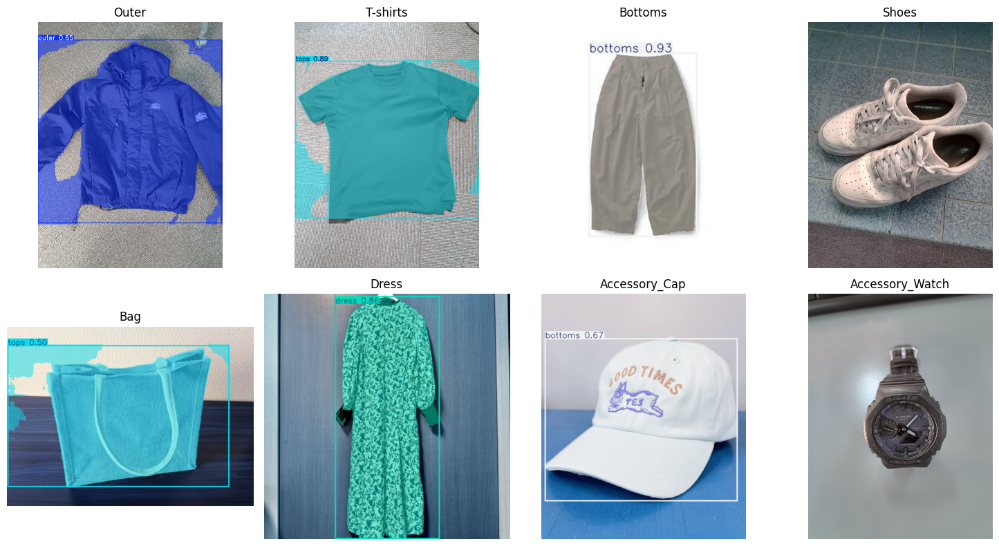

In [24]:
# アノテーション付き画像を格納する新しい辞書
annotated_images = {}

# 前のステップで作った processed_results 辞書をループ
# nameはタイトル（"T-shirts"など）、resultは結果オブジェクト
for name, result in processed_results.items():
    # 予測結果を描画した画像を生成（plotメソッド）
    # plot()はデフォルトでBGRなので、表示用にRGBに変換しておく
    img_bgr = result.plot()
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    # 辞書に保存
    annotated_images[name] = img_rgb

print("すべての画像のアノテーション処理（描画）が完了しました！")

# 画面全体のサイズを設定 (横に4枚並ぶので、横幅を広めの15インチに設定)
plt.figure(figsize=(15, 8))

# タイトルのリストを使って、順番に表示
for i, name in enumerate(titles):
    # アノテーション付き画像を取り出す
    img = annotated_images[name]
    
    # 2行 × 4列 の配置エリアを指定 (i + 1 番目の位置)
    plt.subplot(2, 4, i + 1)
    plt.imshow(img)
    plt.title(name)  # 画像のタイトルを表示
    plt.axis("off")  # 枠線と目盛りを非表示

# 隙間を自動調整して綺麗に並べる
plt.tight_layout()

# 画面に表示
plt.show()

In [13]:
# 1. Tシャツ（リストの2番目、インデックス1）の結果オブジェクトを取得
result_Tshirts = processed_results["T-shirts"]

# 2. マスクが検出されたかチェック
if result_Tshirts.masks is None:
    raise Exception("Tシャツのマスクが検出されませんでした")

# 3. マスクデータをCPUに移動させてNumPy配列に変換
masks_Tshirts = result_Tshirts.masks.data.cpu().numpy()

# 4. 1番目（最大）のマスクを抽出
largest_mask_Tshirts = masks_Tshirts[0]

print("Tシャツのマスク抽出に成功しました！")
print("マスクの形状（Shape）:", largest_mask_Tshirts.shape)

Tシャツのマスク抽出に成功しました！
マスクの形状（Shape）: (640, 480)


In [14]:
mask_Tshirts = (largest_mask_Tshirts * 255).astype(np.uint8)#01の画像を0~255の画像へ変換

image_Tshirts = cv2.imread(image_paths[1])
image_Tshirts_rgb = cv2.cvtColor(image_Tshirts, cv2.COLOR_BGR2RGB)

mask_Tshirts = cv2.resize(
    mask_Tshirts,
    (image_Tshirts_rgb.shape[1], image_Tshirts_rgb.shape[0])
)#マスク画像を元画像のサイズにリサイズ

rgba = cv2.cvtColor(image_Tshirts_rgb, cv2.COLOR_RGB2RGBA)

rgba[:, :, 3] = mask_Tshirts

output_path = "output/transparent_v2.png"

Image.fromarray(rgba).save(output_path)

print("保存完了:", output_path)

保存完了: output/transparent_v2.png


(np.float64(-0.5), np.float64(3467.5), np.float64(4623.5), np.float64(-0.5))

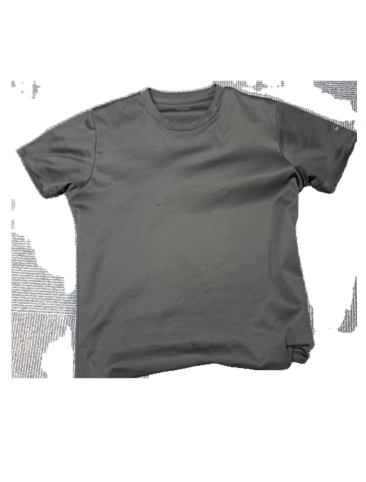

In [15]:
#結果確認
transparent = Image.open(output_path)

plt.figure(figsize=(6,6))
plt.imshow(transparent)
plt.axis("off")

## セグメンテーション -version3.0(Fashionpedia_13classでファインチューニング:epoch数15)-

In [2]:
model = YOLO("../models/fashionpedia_13class.pt")

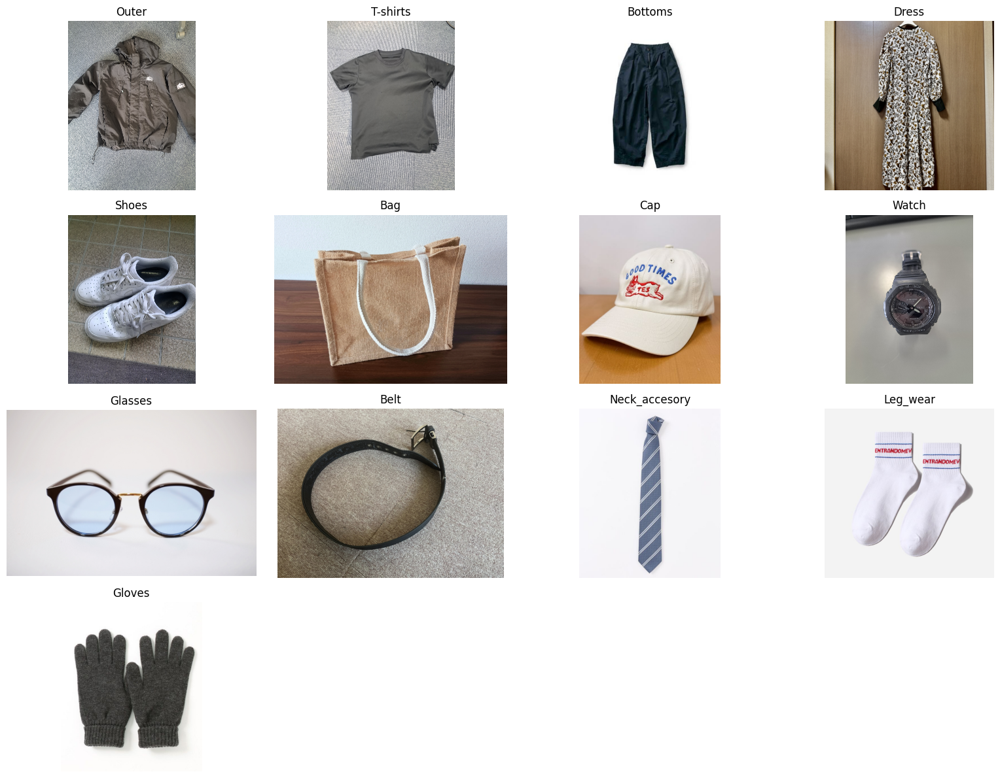

In [7]:
# 1. 画像パスのリスト（8枚分）
image_paths = [
    "input/sample_outer.jpg",             # 0: アウター
    "input/sample_Tshirts.jpg",           # 1: トップス
    "input/sample_bottoms.jpg",           # 2: ボトムス
    "input/sample_dress.jpg",             # 3: ドレス    
    "input/sample_shoes.jpg",             # 4: シューズ
    "input/sample_bag.jpg",               # 5: バッグ　
    "input/sample_cap.jpg",               # 6: 帽子
    "input/sample_watch.jpg",             # 7: 時計
    "input/sample_glasses.jpg",           # 8: メガネ
    "input/sample_belt.jpg",              # 9: ベルト
    "input/sample_neck_accesory.jpg",     # 10: 首まわり(ネクタイ・スカーフ)
    "input/sample_leg_wear.jpg",          # 11: 足まわり(レッグウォーマー・タイツ・靴下)
    "input/sample_gloves.jpg",            # 12: 手袋
]

# 画像のタイトル（表示用）
titles = ["Outer", "T-shirts", "Bottoms", "Dress", "Shoes", "Bag", "Cap", "Watch", "Glasses", "Belt", "Neck_accesory", "Leg_wear", "Gloves"]

# 2. 画面全体のサイズを設定
plt.figure(figsize=(16, 12))

# 3. ループ処理で13枚の画像を順番に読み込んで配置
for i in range(13):
    # 画像の読み込み
    img = cv2.imread(image_paths[i])
    # BGRからRGBに変換
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 3行 × 4列 の配置エリアを指定 (i + 1 番目の位置)
    plt.subplot(4, 4, i + 1)
    plt.imshow(img_rgb)
    plt.title(titles[i])
    plt.axis("off")  # 枠線と目盛りを非表示

# 隙間を自動調整して綺麗に並べる
plt.tight_layout()

# 画面に表示
plt.show()

In [8]:
# 予測結果を保存するための空のリストを用意
all_results = []

# image_paths には、先ほどの8枚の画像パスが入っている前提です
for i, path in enumerate(image_paths):
    # 1. 画像の読み込みとRGB変換
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 2. 予測の実行（タイトルに合わせてログを出すと分かりやすいです）
    print(f"--- Predicting: {titles[i]} ({path}) ---")
    results = model.predict(
        source=img_rgb,
        conf=0.40,
        save=False
    )
    
    # 3. 配列（リスト）に結果を格納していく
    all_results.append(results)

--- Predicting: Outer (input/sample_outer.jpg) ---

0: 640x480 1 tops, 788.7ms
Speed: 76.5ms preprocess, 788.7ms inference, 165.0ms postprocess per image at shape (1, 3, 640, 480)
--- Predicting: T-shirts (input/sample_Tshirts.jpg) ---

0: 640x480 1 tops, 28.2ms
Speed: 2.0ms preprocess, 28.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
--- Predicting: Bottoms (input/sample_bottoms.jpg) ---

0: 640x544 1 bottoms, 43.6ms
Speed: 2.1ms preprocess, 43.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 544)
--- Predicting: Dress (input/sample_dress.jpg) ---

0: 640x640 1 dress, 45.4ms
Speed: 1.3ms preprocess, 45.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)
--- Predicting: Shoes (input/sample_shoes.jpg) ---

0: 640x480 (no detections), 30.2ms
Speed: 3.3ms preprocess, 30.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 480)
--- Predicting: Bag (input/sample_bag.jpg) ---

0: 480x640 1 bottoms, 39.1ms
Speed: 0.8ms preproce

In [9]:
# 8枚分の「純粋な結果オブジェクト」を格納する辞書
processed_results = {}

for i, results in enumerate(all_results):
    # 各画像の最初の要素 [0] を取り出す（これが純粋なマスクやボックスの中身）
    result_object = results[0]
    
    # 画像のタイトル（"T-shirts" や "Shoes" など）をキーにして辞書に保存
    category_name = titles[i]
    processed_results[category_name] = result_object

print("\nすべての結果オブジェクトの読み込みが完了しました！")


すべての結果オブジェクトの読み込みが完了しました！


すべての画像のアノテーション処理（描画）が完了しました！


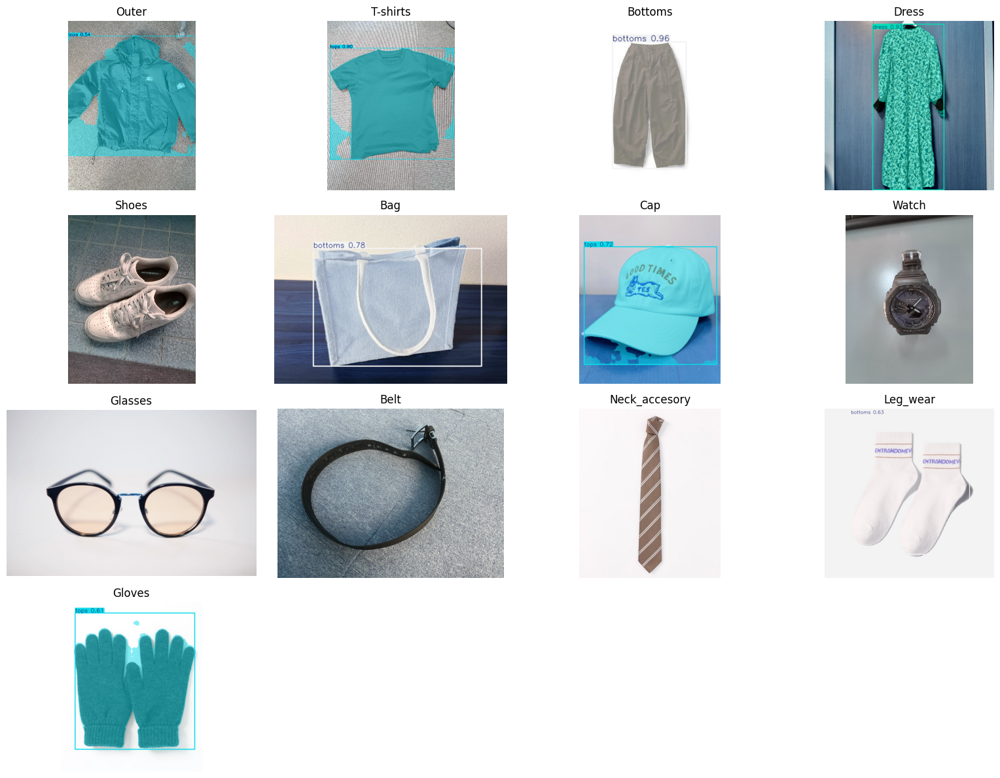

In [12]:
# アノテーション付き画像を格納する新しい辞書
annotated_images = {}

# 前のステップで作った processed_results 辞書をループ
# nameはタイトル（"T-shirts"など）、resultは結果オブジェクト
for name, result in processed_results.items():
    # 予測結果を描画した画像を生成（plotメソッド）
    # plot()はデフォルトでBGRなので、表示用にRGBに変換しておく
    img_bgr = result.plot()
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    # 辞書に保存
    annotated_images[name] = img_rgb

print("すべての画像のアノテーション処理（描画）が完了しました！")

# 画面全体のサイズを設定 (横に4枚並ぶので、横幅を広めの15インチに設定)
plt.figure(figsize=(16, 12))

# タイトルのリストを使って、順番に表示
for i, name in enumerate(titles):
    # アノテーション付き画像を取り出す
    img = annotated_images[name]
    
    # 4行 × 4列 の配置エリアを指定 (i + 1 番目の位置)
    plt.subplot(4, 4, i + 1)
    plt.imshow(img)
    plt.title(name)  # 画像のタイトルを表示
    plt.axis("off")  # 枠線と目盛りを非表示

# 隙間を自動調整して綺麗に並べる
plt.tight_layout()

# 画面に表示
plt.show()

## セグメンテーション -version4.0(Fashionpedia_9classでファインチューニング:epoch数30+data_augumentation)-

In [2]:
model = YOLO("../models/fashionpedia_9class_with_data_augmentation.pt")

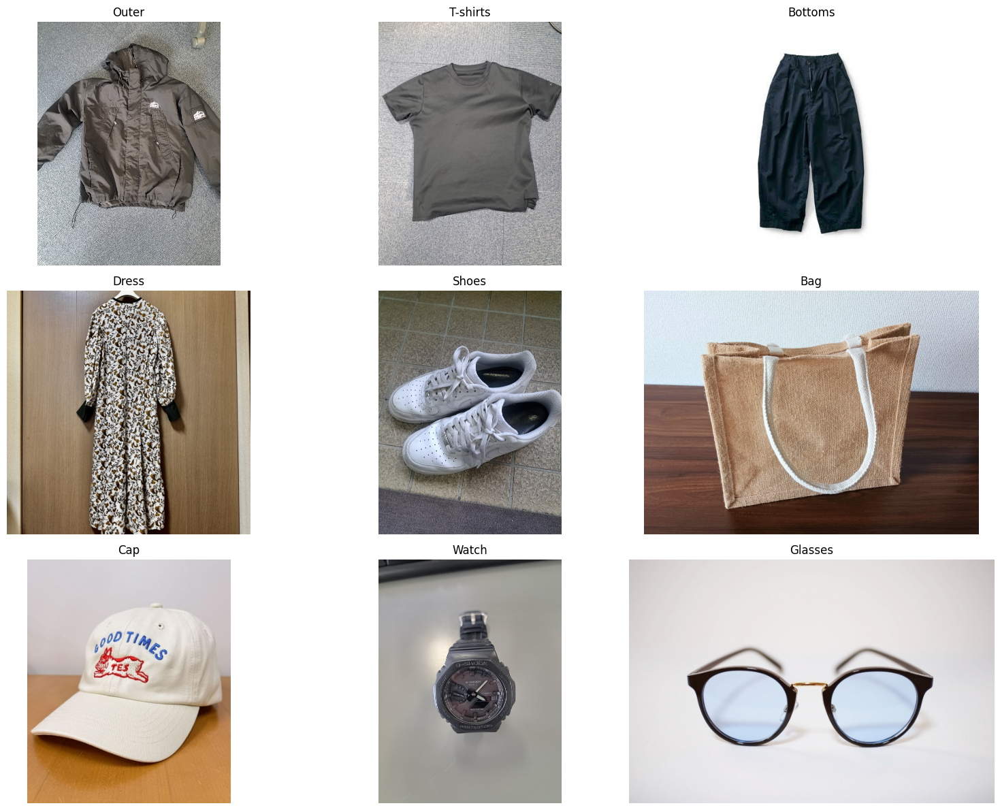

In [3]:
# 1. 画像パスのリスト（8枚分）
image_paths = [
    "input/sample_outer.jpg",             # 0: アウター
    "input/sample_Tshirts.jpg",           # 1: トップス
    "input/sample_bottoms.jpg",           # 2: ボトムス
    "input/sample_dress.jpg",             # 3: ドレス    
    "input/sample_shoes.jpg",             # 4: シューズ
    "input/sample_bag.jpg",               # 5: バッグ　
    "input/sample_cap.jpg",               # 6: 帽子
    "input/sample_watch.jpg",             # 7: 時計
    "input/sample_glasses.jpg",           # 8: メガネ
]

# 画像のタイトル（表示用）
titles = ["Outer", "T-shirts", "Bottoms", "Dress", "Shoes", "Bag", "Cap", "Watch", "Glasses"]

# 2. 画面全体のサイズを設定
plt.figure(figsize=(16, 12))

# 3. ループ処理で9枚の画像を順番に読み込んで配置
for i in range(9):
    # 画像の読み込み
    img = cv2.imread(image_paths[i])
    # BGRからRGBに変換
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 3行 × 3列 の配置エリアを指定 (i + 1 番目の位置)
    plt.subplot(3, 3, i + 1)
    plt.imshow(img_rgb)
    plt.title(titles[i])
    plt.axis("off")  # 枠線と目盛りを非表示

# 隙間を自動調整して綺麗に並べる
plt.tight_layout()

# 画面に表示
plt.show()

In [4]:
# 予測結果を保存するための空のリストを用意
all_results = []

# image_paths には、先ほどの8枚の画像パスが入っている前提です
for i, path in enumerate(image_paths):
    # 1. 画像の読み込みとRGB変換
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 2. 予測の実行（タイトルに合わせてログを出すと分かりやすいです）
    print(f"--- Predicting: {titles[i]} ({path}) ---")
    results = model.predict(
        source=img_rgb,
        conf=0.40,
        save=False
    )
    
    # 3. 配列（リスト）に結果を格納していく
    all_results.append(results)

--- Predicting: Outer (input/sample_outer.jpg) ---

0: 640x480 1 tops, 57.7ms
Speed: 3.7ms preprocess, 57.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)
--- Predicting: T-shirts (input/sample_Tshirts.jpg) ---

0: 640x480 1 tops, 32.8ms
Speed: 2.4ms preprocess, 32.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)
--- Predicting: Bottoms (input/sample_bottoms.jpg) ---

0: 640x544 1 bottoms, 38.6ms
Speed: 1.2ms preprocess, 38.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 544)
--- Predicting: Dress (input/sample_dress.jpg) ---

0: 640x640 1 dress, 48.9ms
Speed: 0.9ms preprocess, 48.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)
--- Predicting: Shoes (input/sample_shoes.jpg) ---

0: 640x480 2 shoess, 27.2ms
Speed: 3.0ms preprocess, 27.2ms inference, 18.2ms postprocess per image at shape (1, 3, 640, 480)
--- Predicting: Bag (input/sample_bag.jpg) ---

0: 480x640 1 bag, 36.8ms
Speed: 1.0ms preprocess, 36.8ms infe

In [5]:
# 8枚分の「純粋な結果オブジェクト」を格納する辞書
processed_results = {}

for i, results in enumerate(all_results):
    # 各画像の最初の要素 [0] を取り出す（これが純粋なマスクやボックスの中身）
    result_object = results[0]
    
    # 画像のタイトル（"T-shirts" や "Shoes" など）をキーにして辞書に保存
    category_name = titles[i]
    processed_results[category_name] = result_object

print("\nすべての結果オブジェクトの読み込みが完了しました！")


すべての結果オブジェクトの読み込みが完了しました！


すべての画像のアノテーション処理（描画）が完了しました！


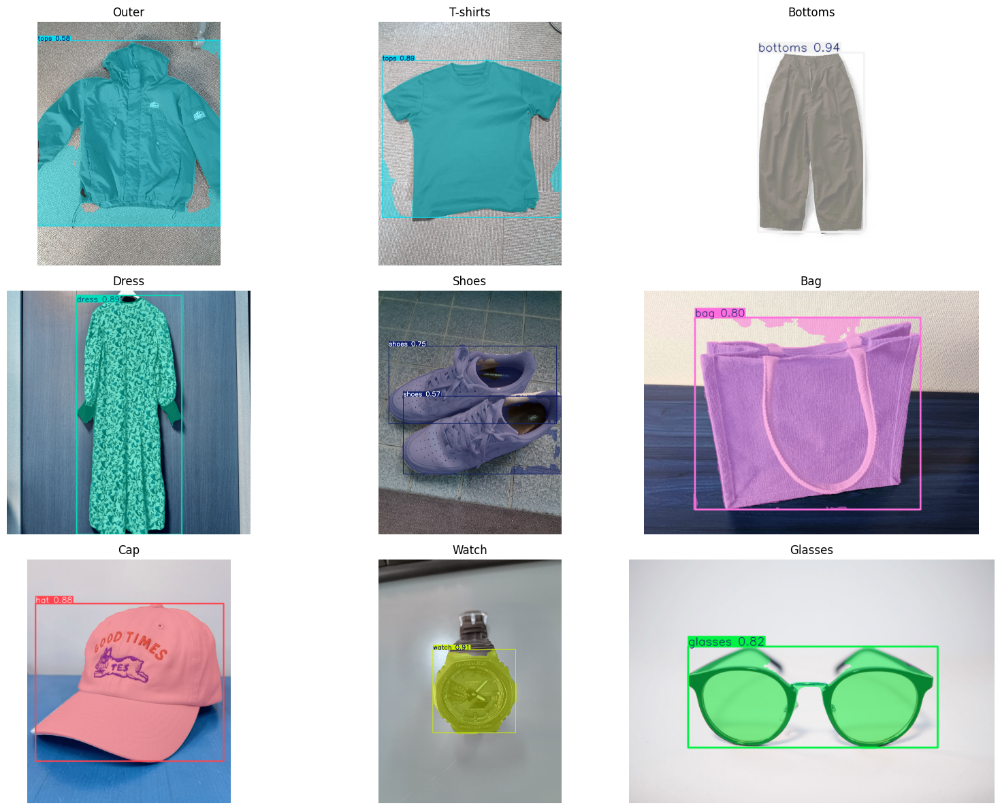

In [7]:
# アノテーション付き画像を格納する新しい辞書
annotated_images = {}

# 前のステップで作った processed_results 辞書をループ
# nameはタイトル（"T-shirts"など）、resultは結果オブジェクト
for name, result in processed_results.items():
    # 予測結果を描画した画像を生成（plotメソッド）
    # plot()はデフォルトでBGRなので、表示用にRGBに変換しておく
    img_bgr = result.plot()
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    # 辞書に保存
    annotated_images[name] = img_rgb

print("すべての画像のアノテーション処理（描画）が完了しました！")

# 画面全体のサイズを設定 (横に4枚並ぶので、横幅を広めの15インチに設定)
plt.figure(figsize=(16, 12))

# タイトルのリストを使って、順番に表示
for i, name in enumerate(titles):
    # アノテーション付き画像を取り出す
    img = annotated_images[name]
    
    # 3行 × 3列 の配置エリアを指定 (i + 1 番目の位置)
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.title(name)  # 画像のタイトルを表示
    plt.axis("off")  # 枠線と目盛りを非表示

# 隙間を自動調整して綺麗に並べる
plt.tight_layout()

# 画面に表示
plt.show()

## Gemini解析

### Gemini APIとの連携

In [13]:
from dotenv import load_dotenv
import os

load_dotenv()

api_key = os.getenv("GEMINI_API_KEY")

#print(api_key)

### Geminiモデルの初期化

In [14]:
import google.generativeai as genai

available_models = [m.name for m in genai.list_models()]
print(available_models)

/users/tw/takahashi/SmartCloset_AI/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_69490/3772955356.py:1: FutureWarning: 

All support for the `google.generativeai` package has ended. It will no longer be receiving 
updates or bug fixes. Please switch to the `google.genai` package as soon as possible.
See README for more details:

https://github.com/google-gemini/deprecated-generative-ai-python/blob/main/README.md

  import google.generativeai as genai


['models/gemini-2.5-flash', 'models/gemini-2.5-pro', 'models/gemini-2.0-flash', 'models/gemini-2.0-flash-001', 'models/gemini-2.0-flash-lite-001', 'models/gemini-2.0-flash-lite', 'models/gemini-2.5-flash-preview-tts', 'models/gemini-2.5-pro-preview-tts', 'models/gemma-4-26b-a4b-it', 'models/gemma-4-31b-it', 'models/gemini-flash-latest', 'models/gemini-flash-lite-latest', 'models/gemini-pro-latest', 'models/gemini-2.5-flash-lite', 'models/gemini-2.5-flash-image', 'models/gemini-3-pro-preview', 'models/gemini-3-flash-preview', 'models/gemini-3.1-pro-preview', 'models/gemini-3.1-pro-preview-customtools', 'models/gemini-3.1-flash-lite-preview', 'models/gemini-3.1-flash-lite', 'models/gemini-3-pro-image-preview', 'models/gemini-3-pro-image', 'models/nano-banana-pro-preview', 'models/gemini-3.1-flash-image-preview', 'models/gemini-3.1-flash-image', 'models/gemini-3.5-flash', 'models/lyria-3-clip-preview', 'models/lyria-3-pro-preview', 'models/gemini-3.1-flash-tts-preview', 'models/gemini-rob

In [15]:
genai.configure(
    api_key=api_key
)

model_gemini = genai.GenerativeModel(
   "gemini-2.5-flash"
)

### GeminiによるTシャツの解析

In [16]:
prompt = """
この衣服画像を解析してください。

以下のJSON形式のみで返してください。

{
  "category": "",
  "color_primary": "",
  "color_secondary": "",}
  "pattern": "",
  "silhouette": ""
}

ルール:
- color_secondary は無ければ null
- 日本語で出力
- JSON以外を出力しない
"""

img = Image.open(output_path)

response = model_gemini.generate_content(
    [prompt, img],
    generation_config={
        "response_mime_type": "application/json"#出力がMARKDOWN形式になってしまったので明示的に追加
    }
)

print(response.text)

{
  "category": "Tシャツ",
  "color_primary": "ダークグレー",
  "color_secondary": null,
  "pattern": "無地",
  "silhouette": "レギュラーフィット"
}


In [17]:
#出力をjsonとして扱う
import json

metadata = json.loads(response.text)

print(metadata)

{'category': 'Tシャツ', 'color_primary': 'ダークグレー', 'color_secondary': None, 'pattern': '無地', 'silhouette': 'レギュラーフィット'}
